In [5]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from sklearn.metrics import (roc_auc_score, precision_score, 
                             recall_score, f1_score, accuracy_score, precision_recall_curve)
from skimage import measure
from scipy.ndimage import gaussian_filter
from scipy.integrate import trapezoid
import cv2
import matplotlib.pyplot as plt

# --- Global Configuration ---
CONFIG = {
    "device": torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    "data_root": "/kaggle/input/mvtec-ad",
    "classes": ["leather", "metal_nut", "bottle", "zipper"],
    "img_size": 256,
    "feature_map_size": 64,
    "n_features": 300,      
    "sigma": 4,             # Spatial smoothing for better generalization
    "batch_size": 16,
    "seed": 42
}

def set_reproducibility(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_reproducibility(CONFIG["seed"])

In [6]:
# --- 1. Dataset Management ---
class MVTecDataset(Dataset):
    def __init__(self, class_name, is_train=True):
        self.class_name = class_name
        self.is_train = is_train
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((CONFIG["img_size"], CONFIG["img_size"])),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        
        mode = "train" if is_train else "test"
        self.img_dir = os.path.join(CONFIG["data_root"], class_name, mode)
        self.gt_dir = os.path.join(CONFIG["data_root"], class_name, "ground_truth")
        self.img_paths, self.gt_paths, self.labels = self._load_metadata()

    def _load_metadata(self):
        img_paths, gt_paths, labels = [], [], []
        if not os.path.exists(self.img_dir): return img_paths, gt_paths, labels
            
        defect_types = sorted(os.listdir(self.img_dir))
        for d_type in defect_types:
            d_path = os.path.join(self.img_dir, d_type)
            for name in sorted(os.listdir(d_path)):
                img_paths.append(os.path.join(d_path, name))
                if self.is_train or d_type == "good":
                    gt_paths.append(None); labels.append(0)
                else:
                    mask_name = name.split(".")[0] + "_mask.png"
                    gt_paths.append(os.path.join(self.gt_dir, d_type, mask_name))
                    labels.append(1)
        return img_paths, gt_paths, labels

    def __len__(self): return len(self.img_paths)
    def __getitem__(self, idx):
        img = cv2.cvtColor(cv2.imread(self.img_paths[idx]), cv2.COLOR_BGR2RGB)
        img_tensor = self.transform(img)
        mask = torch.zeros([1, CONFIG["img_size"], CONFIG["img_size"]])
        if self.gt_paths[idx]:
            m = cv2.imread(self.gt_paths[idx], 0)
            mask = torch.tensor(cv2.resize(m, (CONFIG["img_size"], CONFIG["img_size"]))).unsqueeze(0).float() / 255.0
        return img_tensor, mask, self.labels[idx]

In [7]:
# --- 2. Feature Extractor ---
class FeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = models.wide_resnet50_2(weights=models.Wide_ResNet50_2_Weights.IMAGENET1K_V1).to(CONFIG["device"])
        self.model.eval()
        for p in self.model.parameters(): p.requires_grad = False
        self.features = []
        self.model.layer1[-1].register_forward_hook(self._hook)
        self.model.layer2[-1].register_forward_hook(self._hook)
        self.model.layer3[-1].register_forward_hook(self._hook)

    def _hook(self, m, i, o): self.features.append(o)
    def forward(self, x):
        self.features = []
        with torch.no_grad(): _ = self.model(x)
        return self.features

In [8]:
# --- 3. Core Engine ---
class PaDiMEngine:
    def __init__(self, class_name):
        self.class_name = class_name
        self.extractor = FeatureExtractor()
        self.feature_indices = torch.tensor(random.sample(range(0, 1792), CONFIG["n_features"])).to(CONFIG["device"])
        self.mean, self.inv_cov = None, None

    def train(self):
        loader = DataLoader(MVTecDataset(self.class_name, True), batch_size=CONFIG["batch_size"])
        train_feats = []
        for imgs, _, _ in loader:
            layers = self.extractor(imgs.to(CONFIG["device"]))
            resized = [F.interpolate(l, size=(64, 64), mode='bilinear', align_corners=True) for l in layers]
            train_feats.append(torch.index_select(torch.cat(resized, 1), 1, self.feature_indices).cpu())
            
        train_feats = torch.cat(train_feats, 0)
        N, C, H, W = train_feats.shape
        train_feats = train_feats.view(N, C, H * W)
        self.mean = torch.mean(train_feats, 0).unsqueeze(0).to(CONFIG["device"])
        centered = train_feats - torch.mean(train_feats, 0).unsqueeze(0)
        centered = centered.permute(2, 1, 0)
        cov = torch.bmm(centered, centered.transpose(1, 2)) / (N - 1)
        cov += 0.01 * torch.eye(C) # Covariance Shrinkage for Generalization
        self.inv_cov = torch.inverse(cov).to(CONFIG["device"])

    def evaluate(self):
        loader = DataLoader(MVTecDataset(self.class_name, False), batch_size=1)
        labels, masks, scores, imgs = [], [], [], []
        for img, mask, label in loader:
            layers = self.extractor(img.to(CONFIG["device"]))
            resized = [F.interpolate(l, size=(64, 64), mode='bilinear', align_corners=True) for l in layers]
            emb = torch.index_select(torch.cat(resized, 1), 1, self.feature_indices).view(1, CONFIG["n_features"], -1)
            delta = (emb - self.mean).transpose(1, 2).reshape(-1, 1, CONFIG["n_features"])
            dist = torch.sqrt(torch.matmul(torch.matmul(delta, self.inv_cov), delta.transpose(1, 2)))
            dist_map = gaussian_filter(dist.reshape(64, 64).cpu().numpy(), sigma=CONFIG["sigma"])
            
            scores.append(cv2.resize(dist_map, (256, 256)))
            imgs.append((img[0].permute(1,2,0).numpy() * [0.229,0.224,0.225] + [0.485,0.456,0.406]).clip(0,1))
            labels.append(label.item()); masks.append(mask[0,0].numpy())
        return self._metrics(labels, masks, np.array(scores), imgs)

    def _metrics(self, labels, masks, scores, imgs):
        img_scores = [np.max(s) for s in scores]
        p, r, ths = precision_recall_curve(labels, img_scores)
        f1_vals = (2*p*r)/(p+r+1e-10)
        best_th = ths[np.argmax(f1_vals)] if len(ths) > 0 else 0
        preds = [1 if s >= best_th else 0 for s in img_scores]
        
        binary_masks = np.array(masks).flatten().astype(int)
        
        return {
            "auc": roc_auc_score(labels, img_scores), "accuracy": accuracy_score(labels, preds),
            "precision": precision_score(labels, preds, zero_division=0), "recall": recall_score(labels, preds, zero_division=0),
            "f1": f1_score(labels, preds, zero_division=0), "pixel_auc": roc_auc_score(binary_masks, scores.flatten()),
            "viz": (imgs, masks, scores)
        }

Downloading: "https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth" to /root/.cache/torch/hub/checkpoints/wide_resnet50_2-95faca4d.pth


100%|██████████| 132M/132M [00:00<00:00, 184MB/s]  



[EVALUATION: LEATHER]
AUROC: 1.0000 | Accuracy: 1.0000 | F1: 1.0000
Precision: 1.0000 | Recall: 1.0000 | Pixel-AUROC: 0.9896


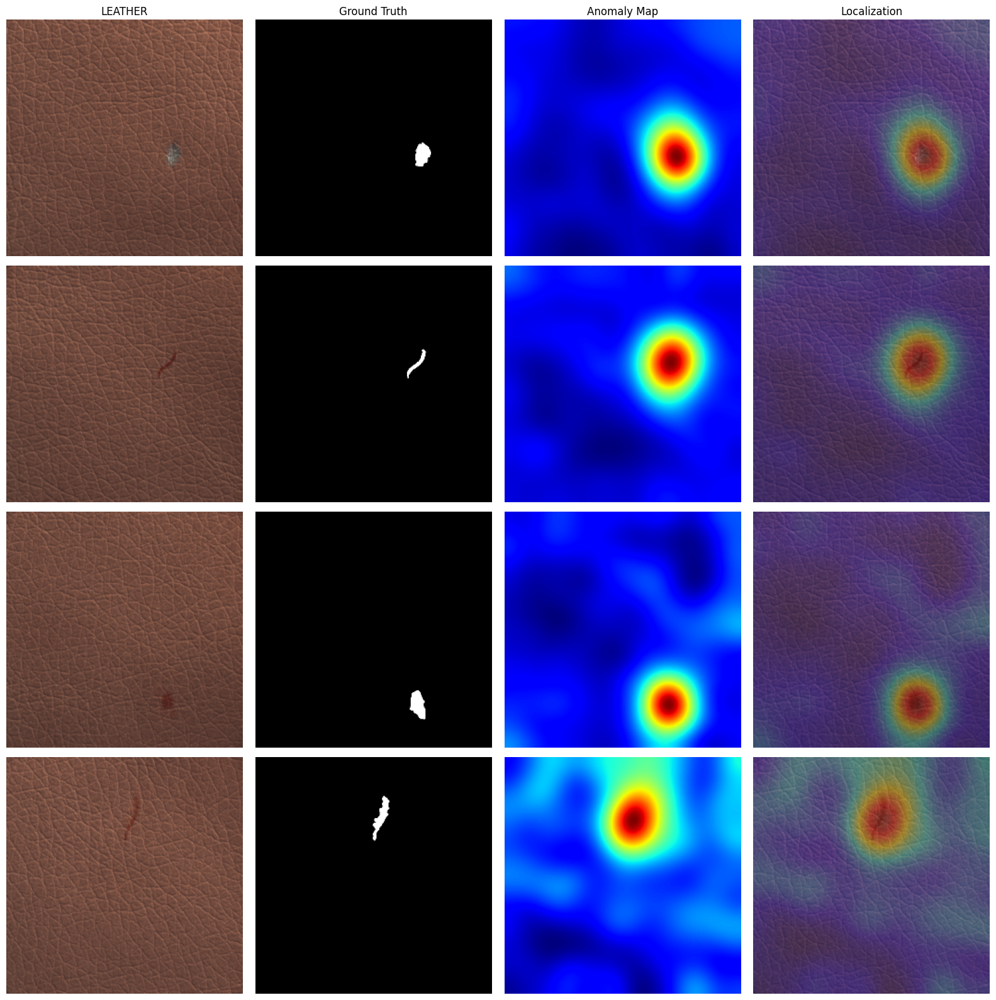


[EVALUATION: METAL_NUT]
AUROC: 0.9907 | Accuracy: 0.9652 | F1: 0.9789
Precision: 0.9588 | Recall: 1.0000 | Pixel-AUROC: 0.9863


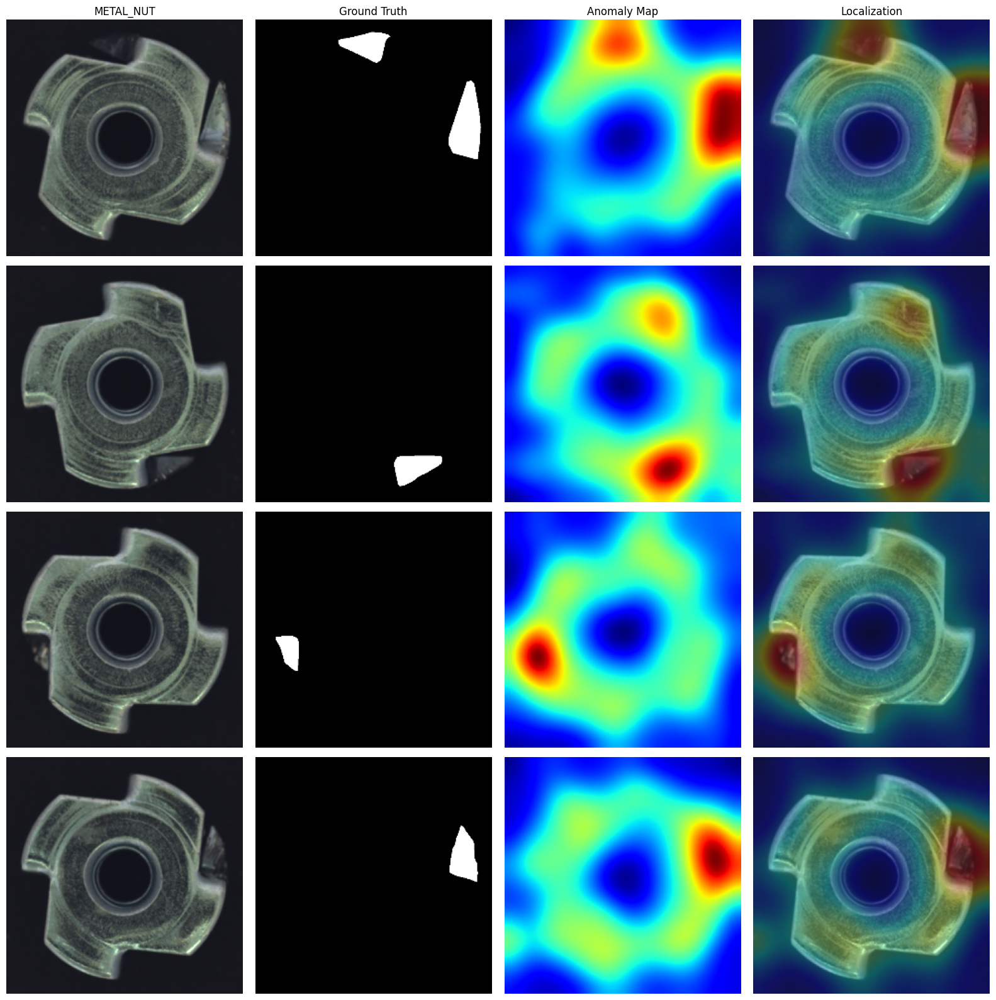


[EVALUATION: BOTTLE]
AUROC: 1.0000 | Accuracy: 1.0000 | F1: 1.0000
Precision: 1.0000 | Recall: 1.0000 | Pixel-AUROC: 0.9843


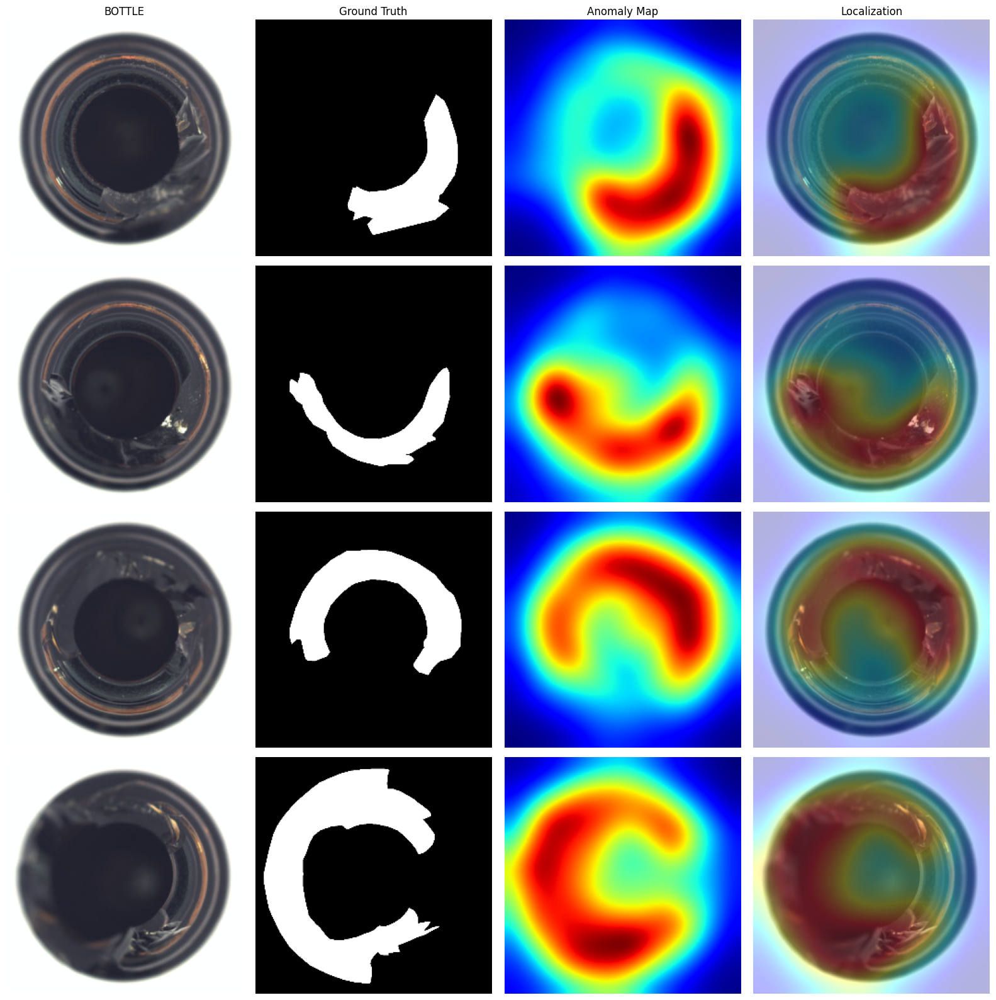


[EVALUATION: ZIPPER]
AUROC: 0.9504 | Accuracy: 0.9536 | F1: 0.9712
Precision: 0.9516 | Recall: 0.9916 | Pixel-AUROC: 0.9788


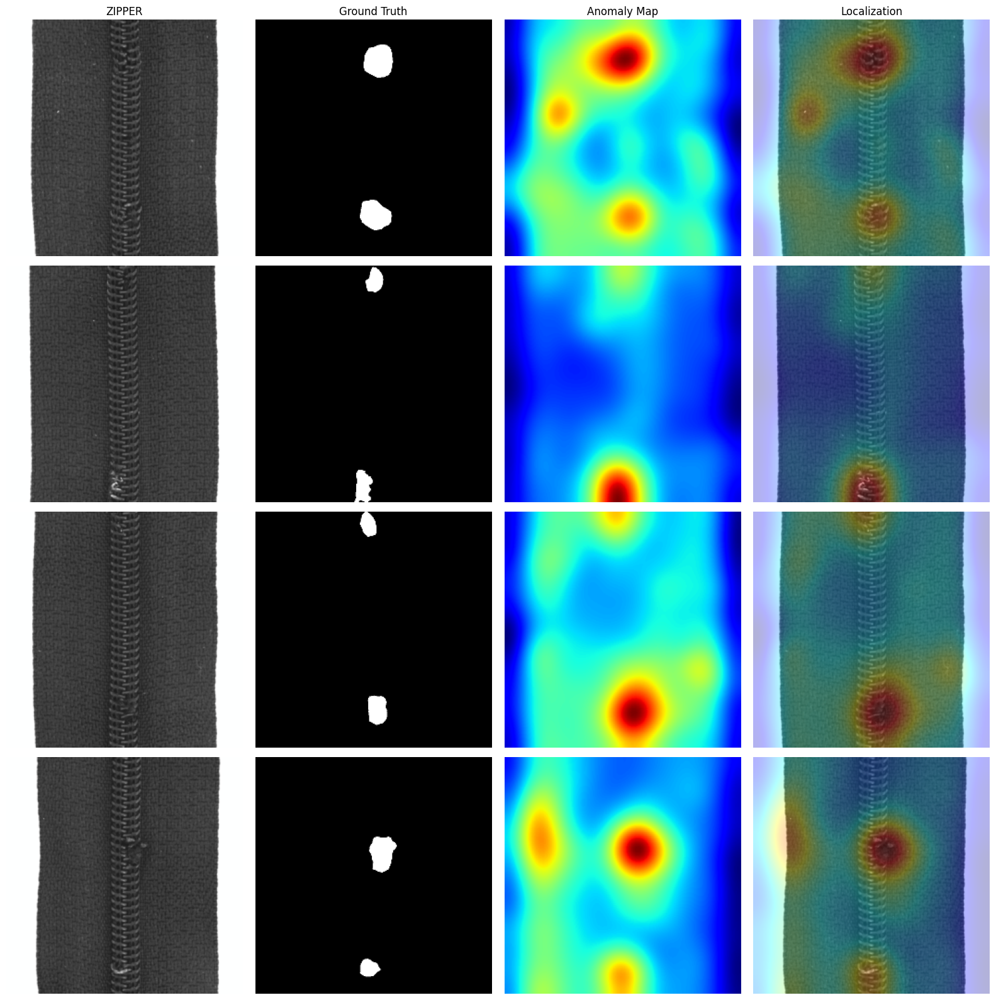

In [9]:
# --- 4. Main Loop & Class-Specific Results ---
final_results = {}
for cls in CONFIG["classes"]:
    torch.cuda.empty_cache()
    engine = PaDiMEngine(cls)
    engine.train()
    final_results[cls] = engine.evaluate()
    
    m = final_results[cls]
    print(f"\n[EVALUATION: {cls.upper()}]")
    print(f"AUROC: {m['auc']:.4f} | Accuracy: {m['accuracy']:.4f} | F1: {m['f1']:.4f}")
    print(f"Precision: {m['precision']:.4f} | Recall: {m['recall']:.4f} | Pixel-AUROC: {m['pixel_auc']:.4f}")

    # 4 Examples per class
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    imgs, masks, scores = m["viz"]
    defect_indices = [j for j, val in enumerate(masks) if np.sum(val) > 100][:4]
    for row, idx in enumerate(defect_indices):
        n_score = (scores[idx] - scores[idx].min()) / (scores[idx].max() - scores[idx].min() + 1e-10)
        heatmap = cv2.applyColorMap((n_score * 255).astype(np.uint8), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        overlay = cv2.addWeighted((imgs[idx] * 255).astype(np.uint8), 0.7, heatmap, 0.3, 0)
        
        axes[row, 0].imshow(imgs[idx]); axes[row, 0].set_title(cls.upper() if row==0 else "")
        axes[row, 1].imshow(masks[idx], cmap='gray'); axes[row, 1].set_title("Ground Truth" if row==0 else "")
        axes[row, 2].imshow(n_score, cmap='jet'); axes[row, 2].set_title("Anomaly Map" if row==0 else "")
        axes[row, 3].imshow(overlay); axes[row, 3].set_title("Localization" if row==0 else "")
        for ax in axes[row]: ax.axis('off')
    plt.tight_layout(); plt.show()

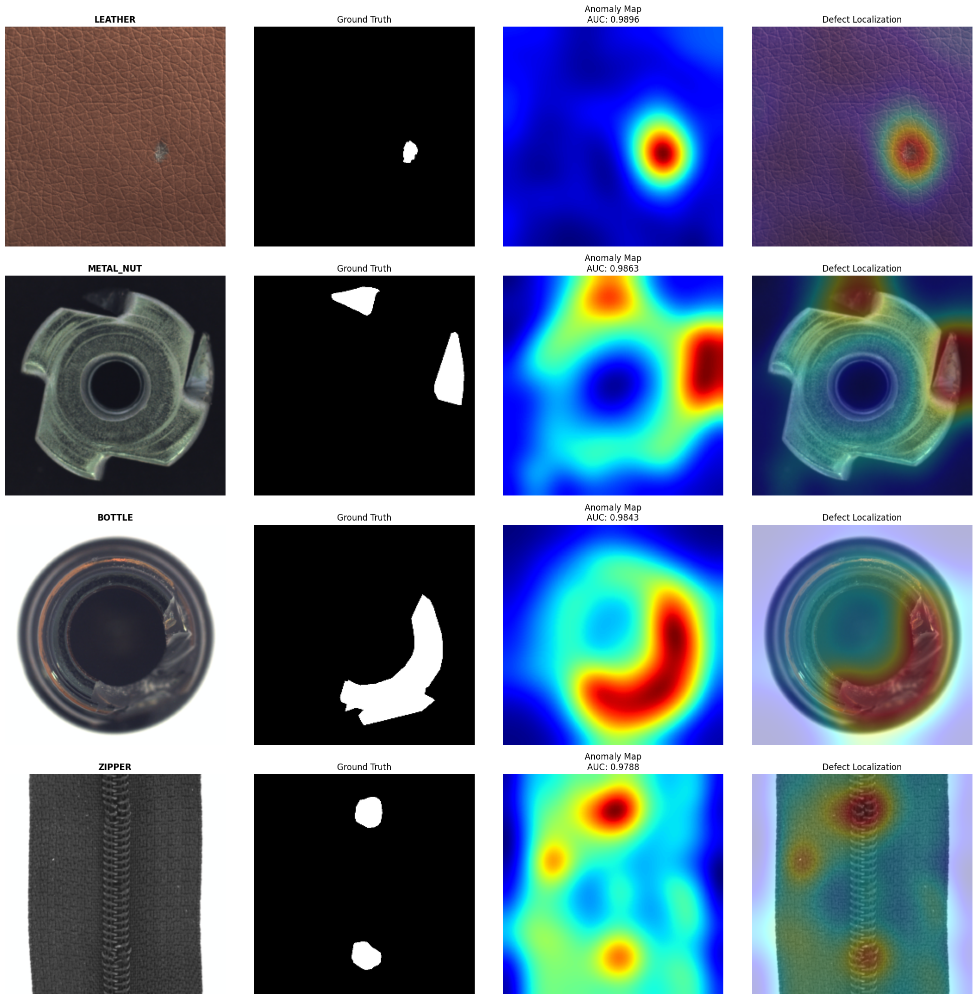

In [10]:
# --- 5. Final Comparison Visualization ---
fig, axes = plt.subplots(4, 4, figsize=(20, 20))
for i, cls in enumerate(CONFIG["classes"]):
    imgs, masks, scores = final_results[cls]["viz"]
    idx = next(j for j, m in enumerate(masks) if np.sum(m) > 100)
    
    n_score = (scores[idx] - scores[idx].min()) / (scores[idx].max() - scores[idx].min() + 1e-10)
    heatmap = cv2.applyColorMap((n_score * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted((imgs[idx] * 255).astype(np.uint8), 0.7, heatmap, 0.3, 0)

    axes[i, 0].imshow(imgs[idx]); axes[i, 0].set_title(cls.upper(), fontweight='bold')
    axes[i, 1].imshow(masks[idx], cmap='gray'); axes[i, 1].set_title("Ground Truth")
    axes[i, 2].imshow(n_score, cmap='jet'); axes[i, 2].set_title(f"Anomaly Map\nAUC: {final_results[cls]['pixel_auc']:.4f}")
    axes[i, 3].imshow(overlay); axes[i, 3].set_title("Defect Localization")
    for ax in axes[i]: ax.axis('off')
plt.tight_layout(); plt.show()

In [11]:
# --- Consolidated Metrics Summary for All Classes ---

# Header for the professional metrics report
print("\n" + "="*95)
print(f"{'Object Class':<15} | {'Img AUROC':<10} | {'Pix AUROC':<10} | {'F1 Score':<10} | {'Accuracy':<10} | {'Precision':<10} | {'Recall':<10}")
print("="*95)

# Iterating through stored results to populate the table
for cls in CONFIG["classes"]:
    m = final_results[cls]
    print(f"{cls.upper():<15} | "
          f"{m['auc']:<10.4f} | "
          f"{m['pixel_auc']:<10.4f} | "
          f"{m['f1']:<10.4f} | "
          f"{m['accuracy']:<10.4f} | "
          f"{m['precision']:<10.4f} | "
          f"{m['recall']:<10.4f}")

print("="*95)


Object Class    | Img AUROC  | Pix AUROC  | F1 Score   | Accuracy   | Precision  | Recall    
LEATHER         | 1.0000     | 0.9896     | 1.0000     | 1.0000     | 1.0000     | 1.0000    
METAL_NUT       | 0.9907     | 0.9863     | 0.9789     | 0.9652     | 0.9588     | 1.0000    
BOTTLE          | 1.0000     | 0.9843     | 1.0000     | 1.0000     | 1.0000     | 1.0000    
ZIPPER          | 0.9504     | 0.9788     | 0.9712     | 0.9536     | 0.9516     | 0.9916    
